In [224]:
import os
from pathlib import Path
from math import ceil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from joblib import dump
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import classification_report, confusion_matrix, precision_score
import graphviz
import dtale
import phik
from phik import resources, report
import sompy
from sklearn.manifold import TSNE
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView
from sklearn.neighbors import LocalOutlierFactor
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.base import clone
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import pairwise_distances
from numpy import quantile, where, random
import matplotlib.cm as cm
from kmodes.kmodes import KModes
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.preprocessing import (Normalizer,
                                   MinMaxScaler,
                                   RobustScaler,
                                   StandardScaler)
import warnings
warnings.filterwarnings("ignore")
import logging
from sklearn.cluster import KMeans
logging.getLogger('matplotlib').setLevel(logging.ERROR)

In [2]:
df_clean = pd.read_csv('/Users/lilou/Desktop/BCwDS/cleaneddata.csv')

In [87]:
df_clean.head(10)

,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Complain,Mailfriend,Emailfriend
Custid,,,,,,,,,,,,,,,,,,,,,,,,,,,
1001,789,68,16,90782,0,0,29,66,1402,699,3,37,5,44,10,3,2,19,4,0,1,0,0,0,0,0,0
1002,623,78,20,113023,0,0,31,6,1537,565,1,55,1,38,4,2,2,9,1,0,0,0,0,0,0,0,0
1003,583,24,18,28344,1,0,4,69,44,-3,66,32,19,24,1,24,63,59,7,1,0,0,0,0,0,1,1
1004,893,59,19,93571,0,1,21,10,888,207,12,60,10,19,6,5,15,35,5,0,0,0,0,0,0,0,0
1005,1062,59,18,91852,0,1,25,26,1138,355,5,59,5,28,4,4,19,34,6,0,0,0,1,0,0,0,0
1006,792,32,20,22386,1,1,5,65,56,-18,96,47,2,48,2,1,29,67,9,1,0,0,0,0,0,1,0
1007,1120,45,17,69485,1,1,11,73,345,-45,61,71,7,13,1,8,3,46,7,0,0,0,0,0,0,0,0
1008,658,54,18,68602,0,1,2,44,41,9,15,84,1,12,2,0,3,37,3,0,0,0,0,0,0,0,0
1009,792,74,18,109499,0,0,29,75,1401,613,3,38,9,35,9,9,9,17,1,0,0,1,0,0,0,0,0


In [4]:
df_clean = df_clean.sort_values(by = 'Custid')
df_clean = df_clean.set_index('Custid')

In [5]:
df_clean

,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,LTV,...,WebPurchase,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Complain,Mailfriend,Emailfriend
Custid,,,,,,,,,,,,,,,,,,,,,
1001,789,68,16,90782,0,0,29,66,1402,699,...,19,4,0,1,0,0,0,0,0,0
1002,623,78,20,113023,0,0,31,6,1537,565,...,9,1,0,0,0,0,0,0,0,0
1003,583,24,18,28344,1,0,4,69,44,-3,...,59,7,1,0,0,0,0,0,1,1
1004,893,59,19,93571,0,1,21,10,888,207,...,35,5,0,0,0,0,0,0,0,0
1005,1062,59,18,91852,0,1,25,26,1138,355,...,34,6,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10995,1025,39,15,58121,1,1,4,6,61,-8,...,71,8,0,0,0,0,0,0,0,0
10996,967,28,17,54292,0,0,23,72,1011,436,...,31,6,0,0,0,1,0,0,0,0
10998,586,69,19,99628,0,0,30,98,1469,618,...,18,3,0,0,0,0,0,0,0,0


## Data Normalization 

In [6]:
df_minmax = df_clean.copy()

In [7]:
non_metric_features = ['Kidhome','Teenhome', 'SMRack', 'LGRack', 'Humid',
                       'Spcork','Bucket','Complain','Mailfriend','Emailfriend']
metric_features = df_minmax.columns.drop(non_metric_features).to_list()

In [8]:
metric_features = df_minmax.columns.values#data_1st_outliers.columns.values

In [9]:
scaler = MinMaxScaler()#StandardScaler()
scaled_feat = scaler.fit_transform(df_minmax[metric_features])
scaled_feat

array([[0.34142857, 0.83333333, 0.5       , ..., 0.        , 0.        ,
        0.        ],
       [0.10428571, 1.        , 1.        , ..., 0.        , 0.        ,
        0.        ],
       [0.04714286, 0.1       , 0.75      , ..., 0.        , 1.        ,
        1.        ],
       ...,
       [0.05142857, 0.85      , 0.875     , ..., 0.        , 0.        ,
        0.        ],
       [0.06857143, 0.78333333, 0.25      , ..., 0.        , 0.        ,
        0.        ],
       [0.31571429, 0.03333333, 0.25      , ..., 0.        , 1.        ,
        0.        ]])

In [10]:
df_minmax[metric_features] = scaled_feat

In [11]:
df_minmax = df_minmax[metric_features] 

In [12]:
non_metric_features = ['Kidhome','Teenhome', 'SMRack', 'LGRack', 'Humid',
                       'Spcork','Bucket','Complain','Mailfriend','Emailfriend']
metric_features = df_minmax.columns.drop(non_metric_features).to_list()

NumExpr defaulting to 4 threads.


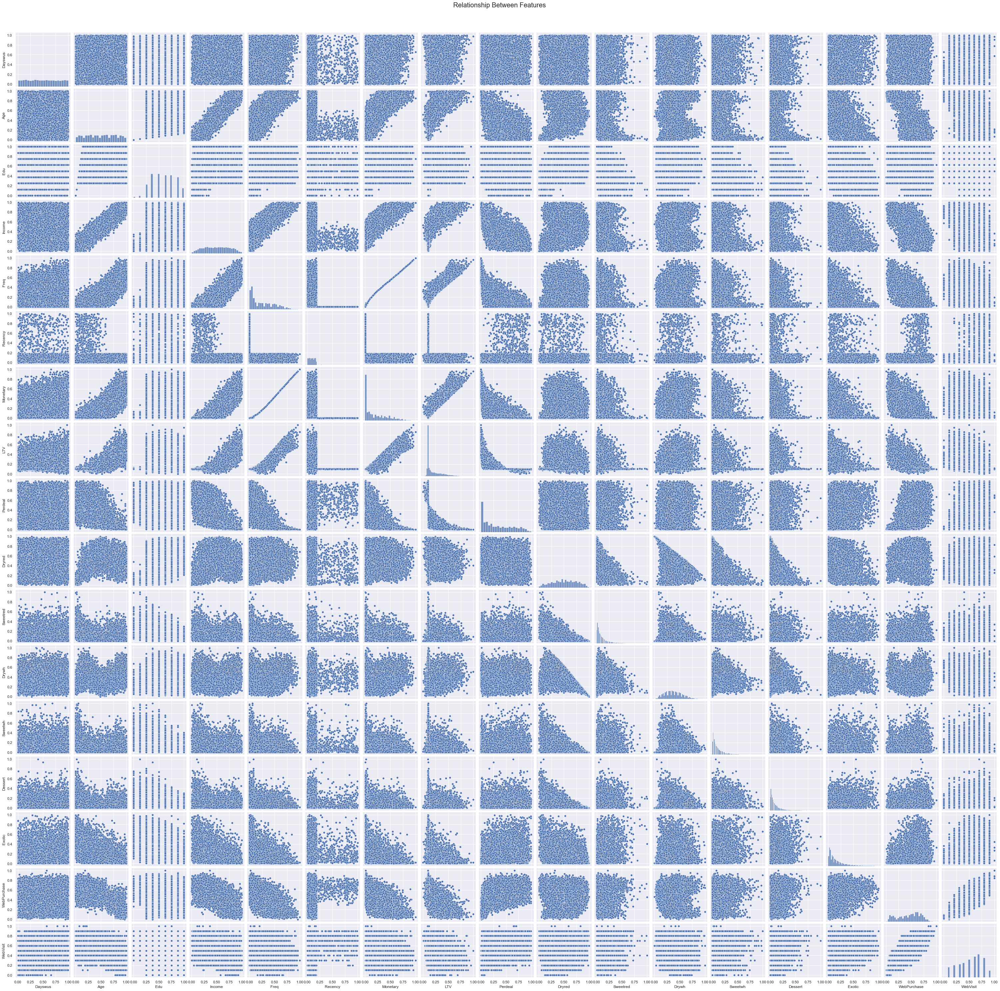

In [88]:
# Pairwise Relationship of Numerical Variables
sns.set()
features = metric_features
sns.pairplot(data=df_minmax[features], diag_kind="hist")
plt.subplots_adjust(top=0.95)
plt.suptitle("Relationship Between Features", fontsize=20)

plt.show()

## Clustering with KMeans

### Number of Clusters: Inertia & Silhouette

KMeans on the metric features (product + customer)

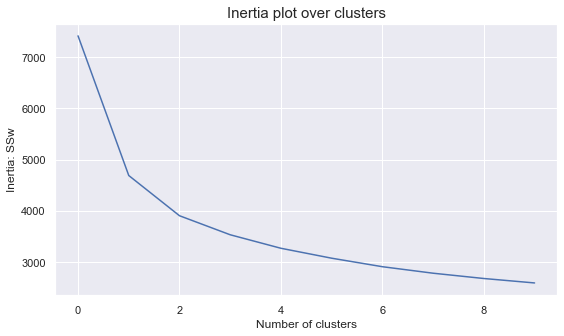

In [144]:
inertia = []
for n_clus in range(1,11):
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_minmax[metric_features])
    inertia.append(kmclust.inertia_)
 
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.3102798285730418
For n_clusters = 3, the average silhouette_score is : 0.22447634946876785
For n_clusters = 4, the average silhouette_score is : 0.1835252475687469
For n_clusters = 5, the average silhouette_score is : 0.183539255879498
For n_clusters = 6, the average silhouette_score is : 0.16285881751721362
For n_clusters = 7, the average silhouette_score is : 0.15664081296532392
For n_clusters = 8, the average silhouette_score is : 0.15014566212639938
For n_clusters = 9, the average silhouette_score is : 0.14804291888017035
For n_clusters = 10, the average silhouette_score is : 0.1439799443603851


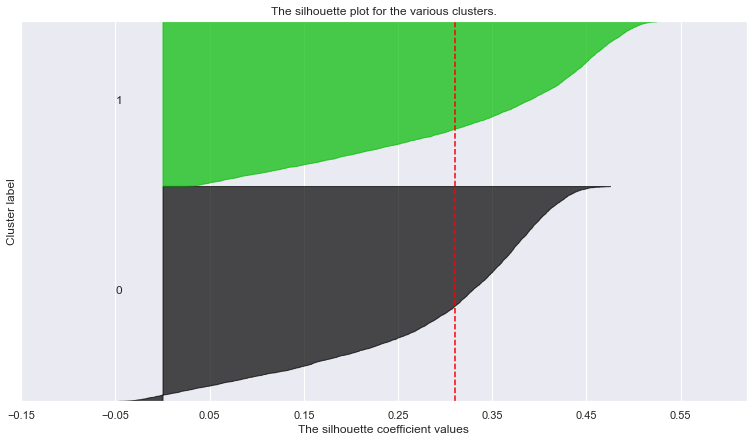

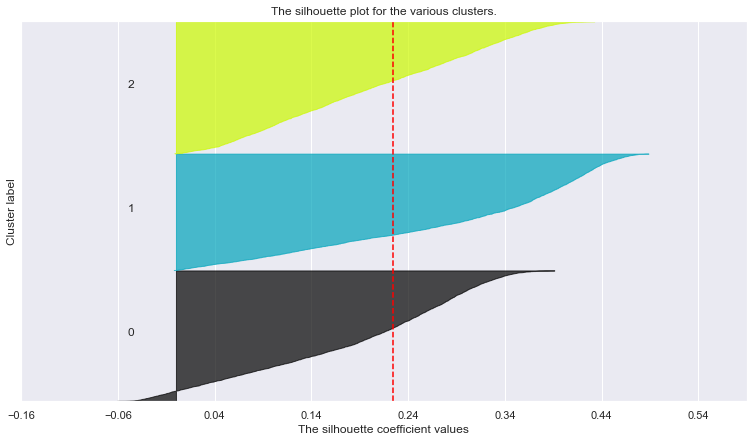

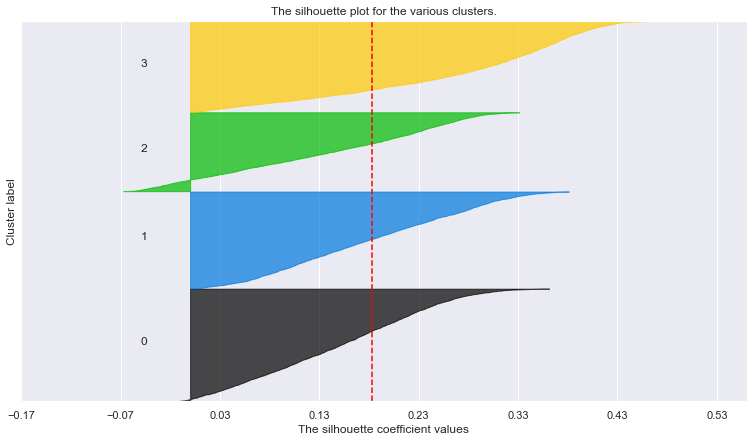

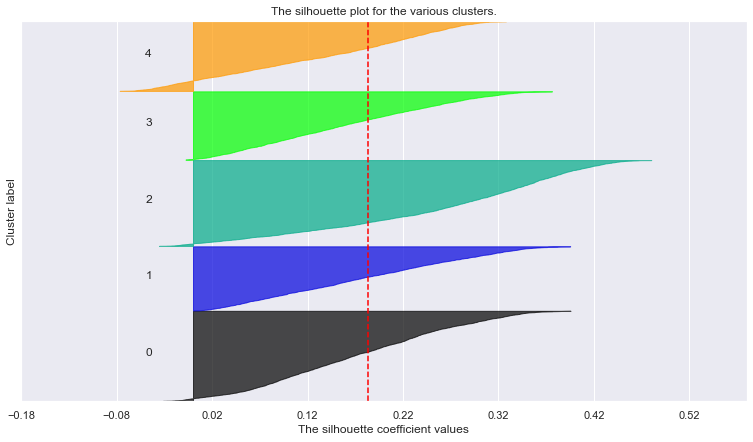

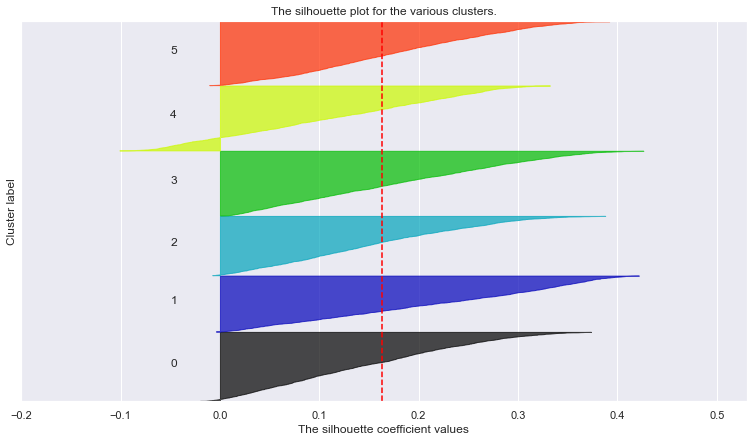

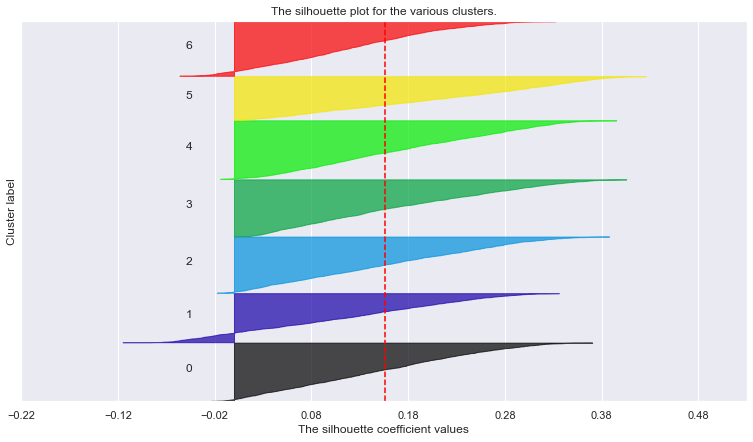

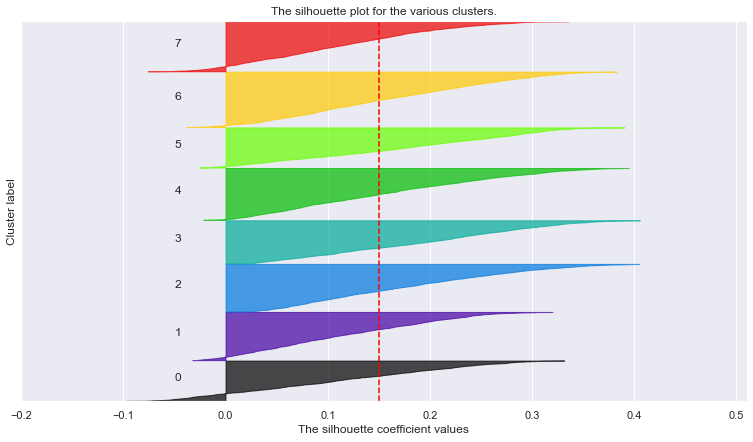

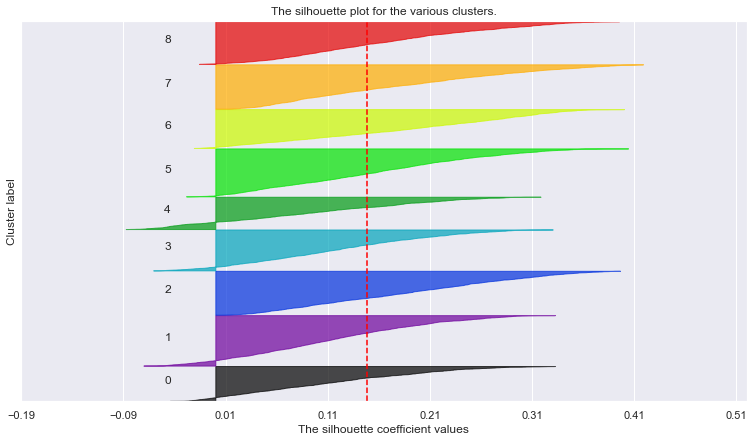

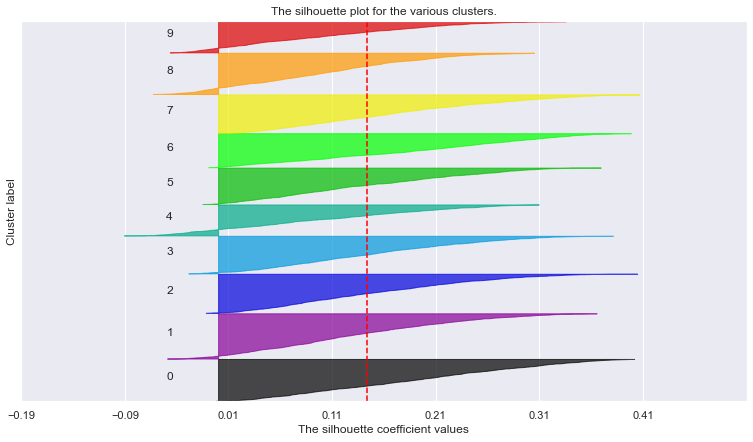

In [93]:
avg_silhouette = []
range_clusters = range(1, 11)
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_minmax[metric_features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_minmax[metric_features], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_minmax[metric_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_minmax[metric_features]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

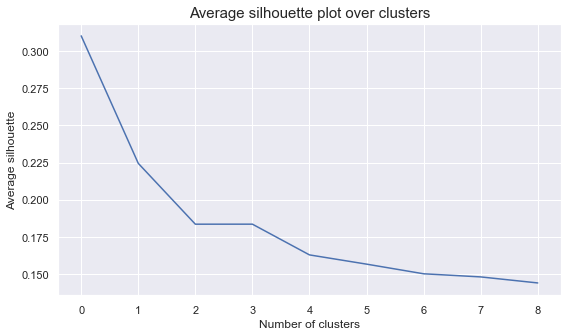

In [94]:
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [145]:
kmclust = KMeans(n_clusters=4 , init="random", random_state=1)
kmclust.fit(df_minmax)
kmclust.predict(df_minmax)
#pd.DataFrame(kmclust.tansform(df_minmax))
df_clustered = df_minmax
df_clustered['cluster'] = kmclust.predict(df_minmax)
df_clustered

pd.set_option('display.max_columns', None)
df_summary = df_clustered.groupby('cluster').mean()
df_summary['count'] = df_clustered.groupby('cluster').count()['LTV']
df_summary

,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Complain,Mailfriend,Emailfriend,count
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.493135,0.283061,0.557026,0.328621,0.904459,0.0,0.157136,0.134054,0.121626,0.162466,0.461935,0.385013,0.138687,0.440118,0.150580,0.121712,0.245119,0.590646,0.643193,0.119427,0.044586,0.103105,0.103901,0.013535,0.012739,0.140525,0.105494,2512
1,0.502964,0.391010,0.610250,0.409358,0.990212,1.0,0.120643,0.127438,0.079655,0.106266,0.676584,0.599710,0.067812,0.344648,0.076339,0.060910,0.182447,0.579449,0.632790,0.083197,0.038608,0.014682,0.021751,0.007613,0.014682,0.114736,0.062534,1839
2,0.492433,0.700548,0.591438,0.661805,0.000000,0.0,0.449415,0.101173,0.399077,0.359747,0.071310,0.403942,0.127610,0.446988,0.142617,0.106971,0.128090,0.255605,0.329902,0.063405,0.074364,0.140117,0.086497,0.007045,0.009785,0.069667,0.016830,2555
3,0.500264,0.576232,0.623412,0.564259,0.000000,1.0,0.281237,0.097943,0.216559,0.202527,0.232390,0.654967,0.068100,0.273146,0.073517,0.060378,0.134472,0.446321,0.520120,0.062125,0.101659,0.021179,0.033533,0.019061,0.009178,0.085775,0.023650,2833


In [146]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

# Notice that the SOM did not converge
sm = sompy.SOMFactory().build(
    df_minmax[metric_features].values, 
    mapsize=(25, 25), 
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=metric_features
)
sm.train(n_job=-1, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.009000 seconds
 Rough training...
 radius_ini: 9.000000 , radius_final: 1.500000, trainlen: 100

 epoch: 1 ---> elapsed time:  0.666000, quantization error: 5.667686

 epoch: 2 ---> elapsed time:  0.252000, quantization error: 3.909914

 epoch: 3 ---> elapsed time:  0.181000, quantization error: 3.834016

 epoch: 4 ---> elapsed time:  0.193000, quantization error: 3.796509

 epoch: 5 ---> elapsed time:  0.193000, quantization error: 3.771163

 epoch: 6 ---> elapsed time:  0.179000, quantization error: 3.764007

 epoch: 7 ---> elapsed time:  0.204000, quantization error: 3.758172

 epoch: 8 ---> elapsed time:  0.467000, quantization error: 3.750526

 epoch: 9 ---> elapsed time:  0.244000, quantization error: 3.741020

 epoch: 10 ---> elapsed time:  0.163000, quantization error: 3.737364

 epoch: 11 ---> elapsed time:  0.155000, quantization error: 3.734176

 epoch: 12 ---> elapsed time:  0.161000, quantization error: 3.730886

 epoch: 13 ---> 

 epoch: 14 ---> elapsed time:  0.166000, quantization error: 2.483946

 epoch: 15 ---> elapsed time:  0.165000, quantization error: 2.478875

 epoch: 16 ---> elapsed time:  0.166000, quantization error: 2.473631

 epoch: 17 ---> elapsed time:  0.151000, quantization error: 2.468314

 epoch: 18 ---> elapsed time:  0.161000, quantization error: 2.462895

 epoch: 19 ---> elapsed time:  0.344000, quantization error: 2.457519

 epoch: 20 ---> elapsed time:  0.223000, quantization error: 2.452462

 epoch: 21 ---> elapsed time:  0.157000, quantization error: 2.447441

 epoch: 22 ---> elapsed time:  0.157000, quantization error: 2.442182

 epoch: 23 ---> elapsed time:  0.166000, quantization error: 2.436970

 epoch: 24 ---> elapsed time:  0.154000, quantization error: 2.431738

 epoch: 25 ---> elapsed time:  0.171000, quantization error: 2.426498

 epoch: 26 ---> elapsed time:  0.159000, quantization error: 2.421232

 epoch: 27 ---> elapsed time:  0.160000, quantization error: 2.415848

 epoch

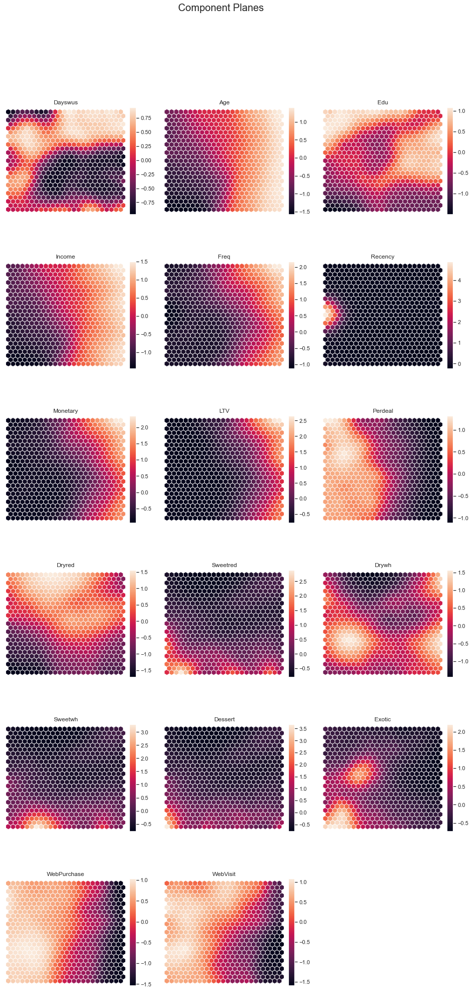

In [147]:
# Component planes on the 50x50 grid
sns.set()
view2D = View2D(12,12,"", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

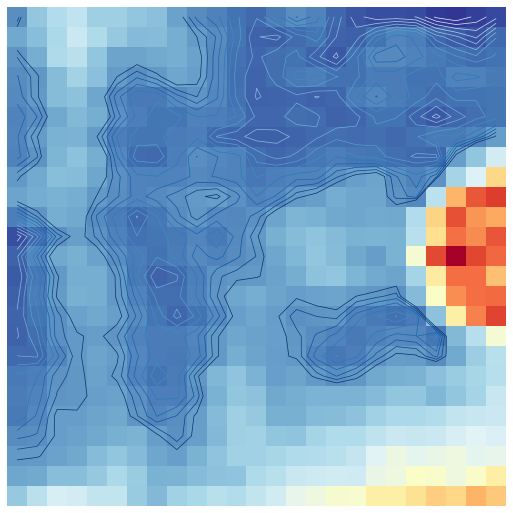

In [148]:
# U-matrix of the 50x50 grid
u = sompy.umatrix.UMatrixView(12, 12, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance2=1, 
    row_normalized=False, 
    show_data=False, 
    contooor=True # Visualize isomorphic curves
)

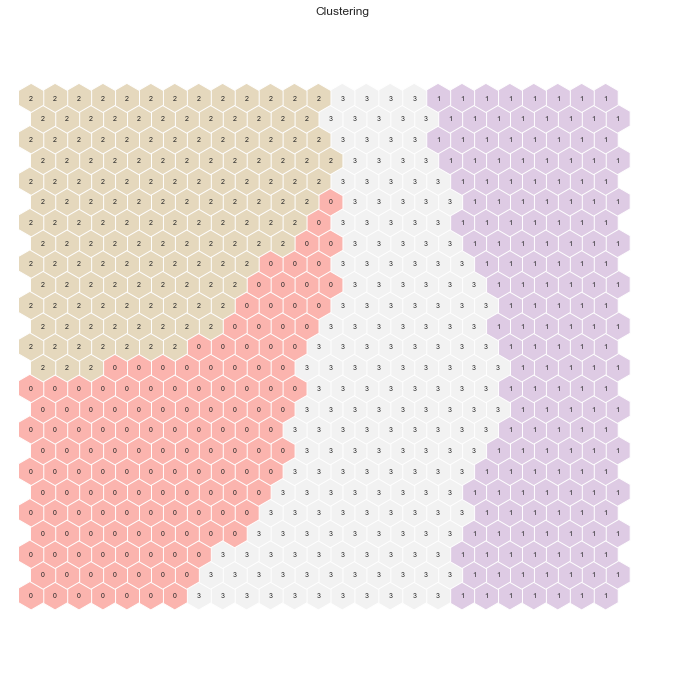

In [149]:
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=15, random_state=1)
nodeclus_labels = sm.cluster(kmeans)

hits  = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [150]:
label = kmeans.fit_predict(df_minmax)

In [151]:
df_summary_bis = df_summary.copy()

### Cluster of the Customer's Features 

In [153]:
customer = df_minmax[['Dayswus','Age', 'Edu', 'Income','Kidhome','Teenhome', 'LTV','Freq','Recency', 'Monetary', 'Perdeal','Complain','Mailfriend', 'Emailfriend','WebPurchase','WebVisit']]
product = df_minmax[['Dryred','Sweetred','Drywh','Sweetwh','Dessert','Exotic','SMRack','LGRack','Humid','Spcork','Bucket']]

In [154]:
customer_metric = set.intersection(set(customer),set(metric_features))


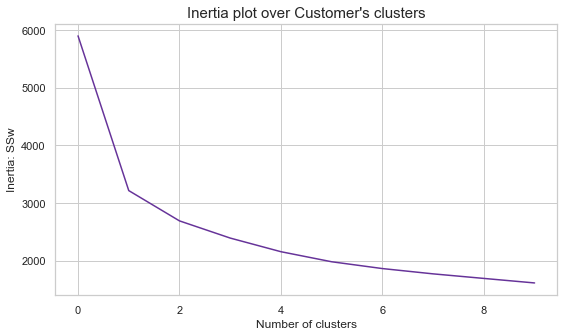

In [420]:
sns.set_theme(style="whitegrid")
inertia = []
for n_clus in range(1,11):
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(customer[customer_metric])
    inertia.append(kmclust.inertia_)
 
plt.figure(figsize=(9,5))
plt.plot(inertia, color = 'rebeccapurple')
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over Customer's clusters", size=15)
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.3754531979537218
For n_clusters = 3, the average silhouette_score is : 0.2486020877474637
For n_clusters = 4, the average silhouette_score is : 0.21354492176233036
For n_clusters = 5, the average silhouette_score is : 0.20949362488187065
For n_clusters = 6, the average silhouette_score is : 0.1976639767652396
For n_clusters = 7, the average silhouette_score is : 0.1878507997529207
For n_clusters = 8, the average silhouette_score is : 0.19432213174377383
For n_clusters = 9, the average silhouette_score is : 0.17989681252468614
For n_clusters = 10, the average silhouette_score is : 0.17913592149520424


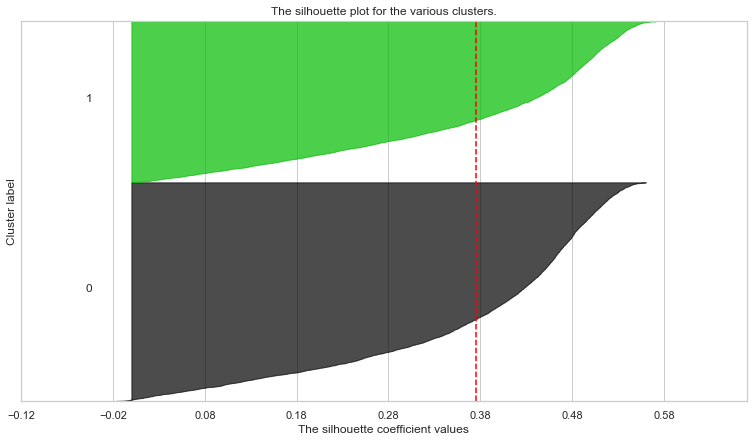

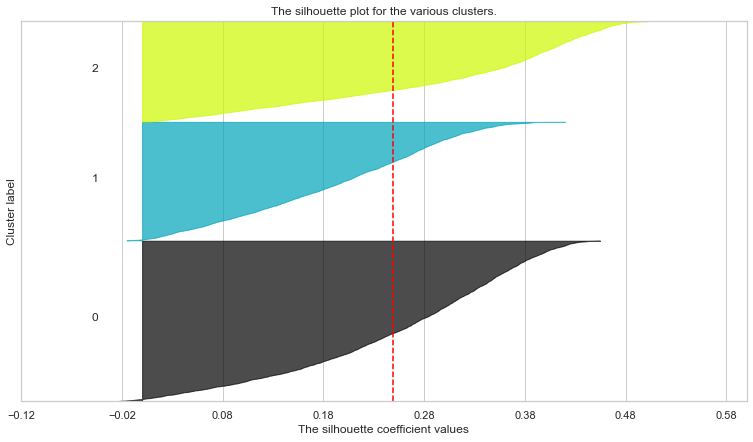

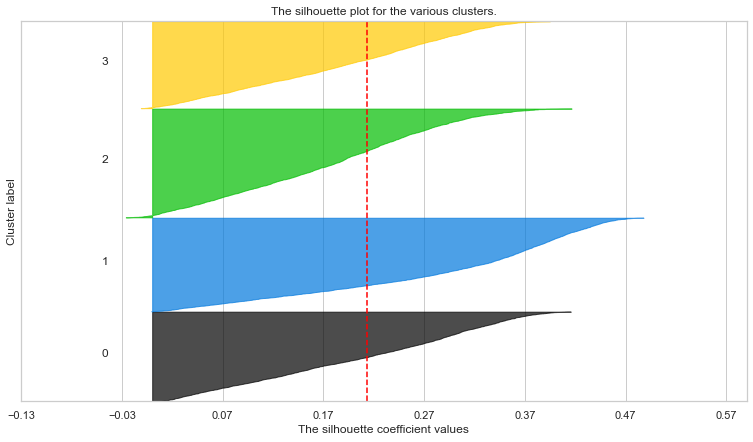

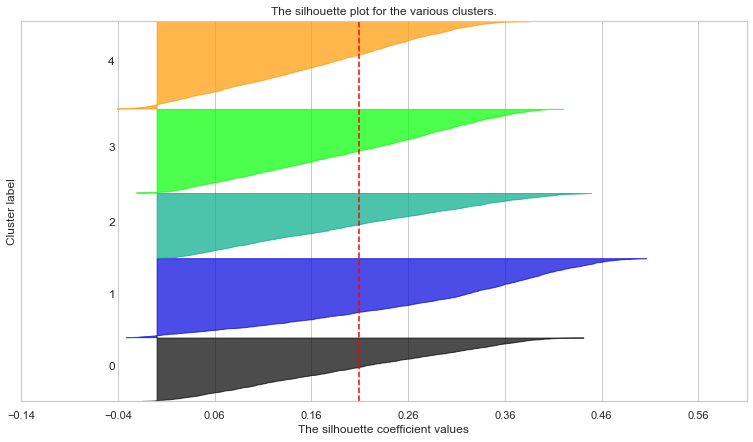

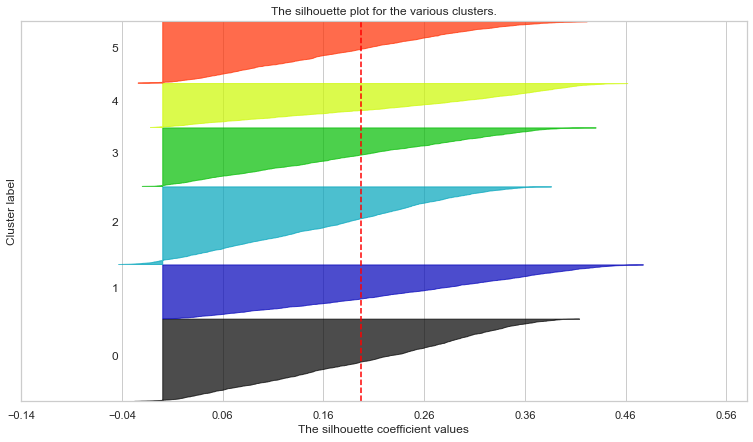

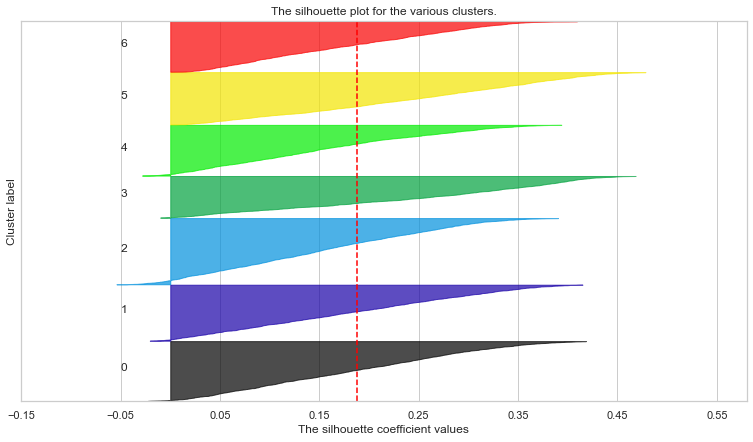

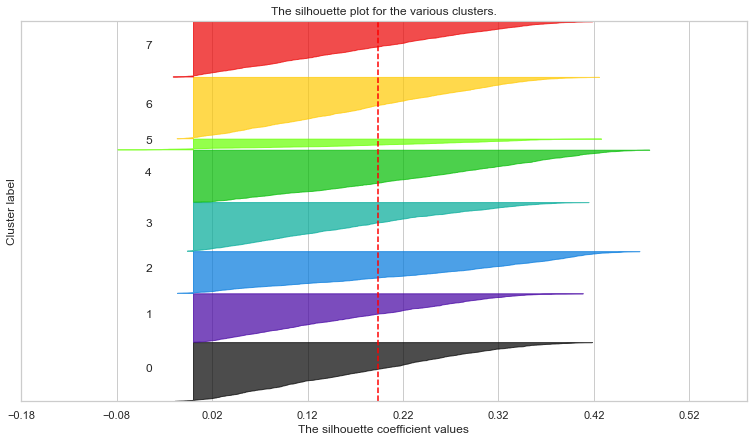

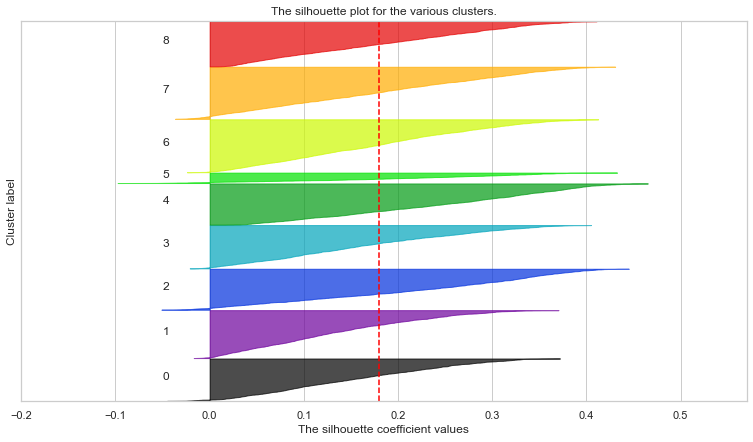

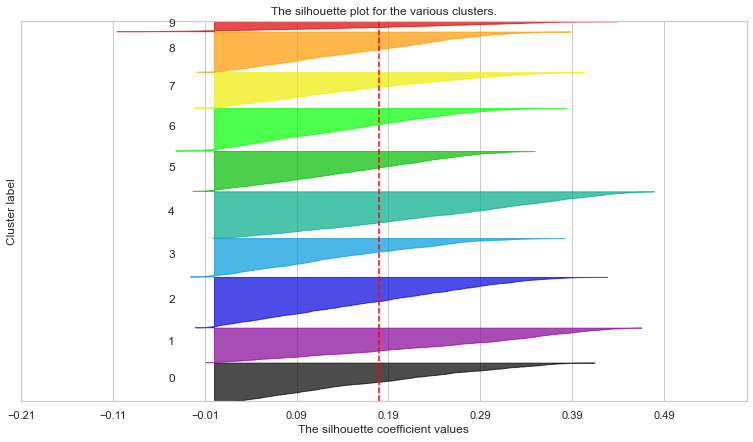

In [148]:
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(customer[customer_metric])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(customer[customer_metric], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(customer[customer_metric], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(customer[customer_metric]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

In [210]:
kmclust = KMeans(n_clusters=3 , init="random", random_state=1)
kmclust.fit(customer[customer_metric])
kmclust.predict(customer[customer_metric])
#pd.DataFrame(kmclust.tansform(df_minmax))
df_clustered = customer[customer_metric]
df_clustered['cluster'] = kmclust.predict(customer[customer_metric])
df_clustered

pd.set_option('display.max_columns', None)
df_summary = df_clustered.groupby('cluster').mean()
df_summary

<ipython-input-210-1154e4fd7955>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Perdeal,Freq,WebPurchase,Income,WebVisit,LTV,Recency,Dayswus,Monetary,Edu,Age
cluster,,,,,,,,,,,
0,0.602636,0.065525,0.626433,0.262770,0.673427,0.098657,0.142534,0.496061,0.033406,0.551160,0.227476
1,0.036560,0.566597,0.185200,0.802097,0.272509,0.435974,0.091505,0.508239,0.517191,0.619862,0.841437
2,0.220123,0.272944,0.463409,0.564354,0.532534,0.185969,0.093417,0.488363,0.201707,0.634571,0.573743


In [250]:
df_customer = df_summary.copy()

In [251]:
df_customer = df_customer.T

In [264]:
df_customer.sort_index(inplace = True)

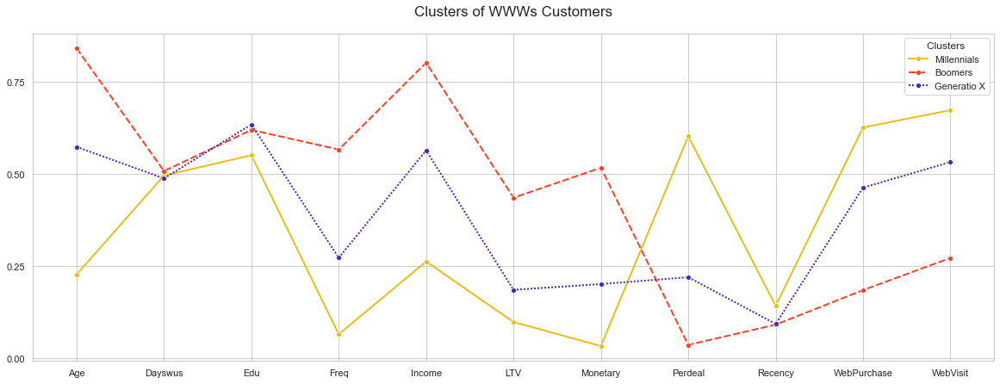

In [385]:
sns.set_theme(style="whitegrid")

ax = fig.add_subplot(1,1,1)


plt.figure(figsize=(20,7))
plt.yticks([0,0.25,0.5,0.75,1])
plt.title('Clusters of WWWs Customers', fontdict = {'fontsize' :17}, pad = 20)

ax.tick_params(axis='y',direction='inout', length=20)
a = sns.lineplot(data=df_customer, marker='o', linewidth=2.0, palette='CMRmap_r')
plt.legend(title='Clusters ', loc='upper right', labels=['Millennials','Boomers','Generatio X'])



In [233]:
df_customer1 = df_customer.copy()

In [234]:
df_customer1['count'] = df_clustered.groupby('cluster').count()['Age']
df_customer1

,Perdeal,Freq,WebPurchase,Income,WebVisit,LTV,Recency,Dayswus,Monetary,Edu,Age,count
cluster,,,,,,,,,,,,
0,0.602636,0.065525,0.626433,0.262770,0.673427,0.098657,0.142534,0.496061,0.033406,0.551160,0.227476,4117
1,0.036560,0.566597,0.185200,0.802097,0.272509,0.435974,0.091505,0.508239,0.517191,0.619862,0.841437,2579
2,0.220123,0.272944,0.463409,0.564354,0.532534,0.185969,0.093417,0.488363,0.201707,0.634571,0.573743,3043


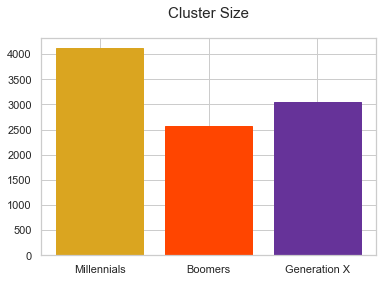

In [384]:
y_pos = np.arange(len(df_customer1.index))

plt.xticks(y_pos,['Millennials','Boomers','Generation X'])
b = plt.bar(df_customer1.index, df_customer1['count'])
plt.title ('Cluster Size',fontdict = {'fontsize' :15}, pad = 20 )
b[0].set_color('goldenrod')
b[1].set_color('orangered')
b[2].set_color('rebeccapurple')

### Cluster of the Product's Features

In [161]:
product_metric = set.intersection(set(product),set(metric_features))
product_metric

{'Dessert', 'Dryred', 'Drywh', 'Exotic', 'Sweetred', 'Sweetwh'}

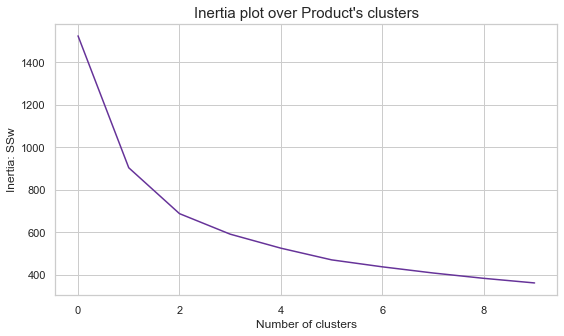

In [419]:
sns.set_theme(style="whitegrid")
inertia = []
for n_clus in range(1,11):
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(product[product_metric])
    inertia.append(kmclust.inertia_)
 
plt.figure(figsize=(9,5))
plt.plot(inertia, color = 'rebeccapurple')
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over Product's clusters", size=15)
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.36408196754737104
For n_clusters = 3, the average silhouette_score is : 0.3417740769829265
For n_clusters = 4, the average silhouette_score is : 0.27012004233610415
For n_clusters = 5, the average silhouette_score is : 0.2739888773991258
For n_clusters = 6, the average silhouette_score is : 0.28654919025662445
For n_clusters = 7, the average silhouette_score is : 0.23943347049327487
For n_clusters = 8, the average silhouette_score is : 0.2427835295111285
For n_clusters = 9, the average silhouette_score is : 0.24558486635623325
For n_clusters = 10, the average silhouette_score is : 0.24749799937222638


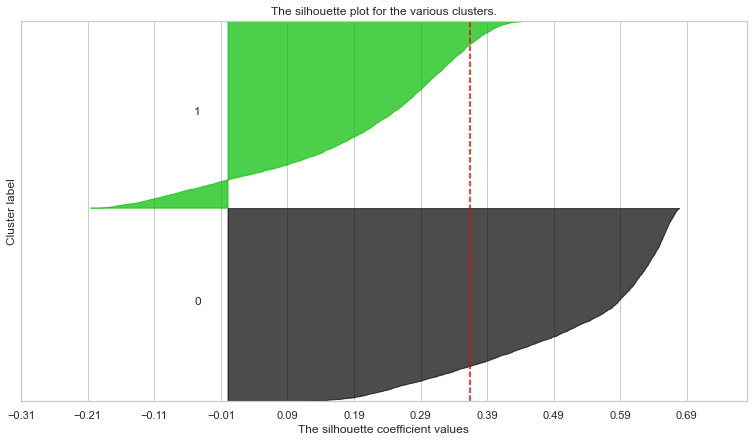

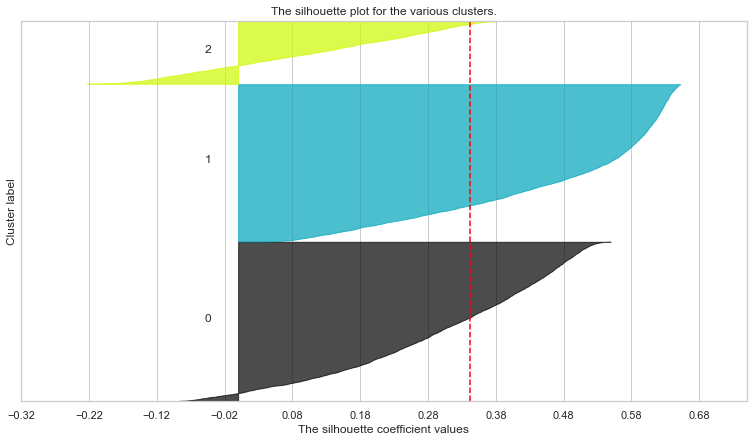

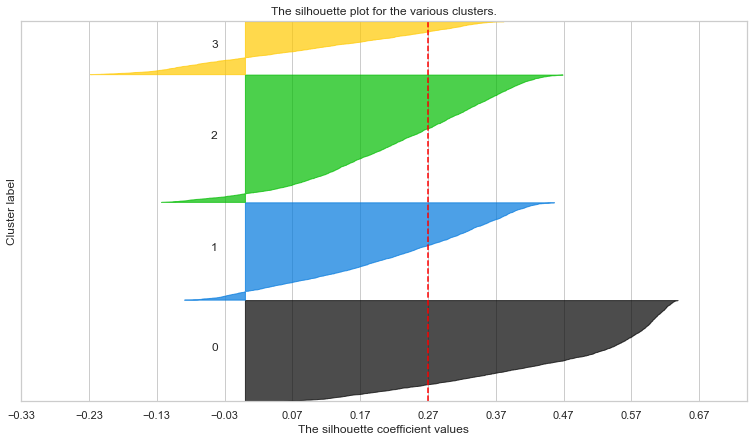

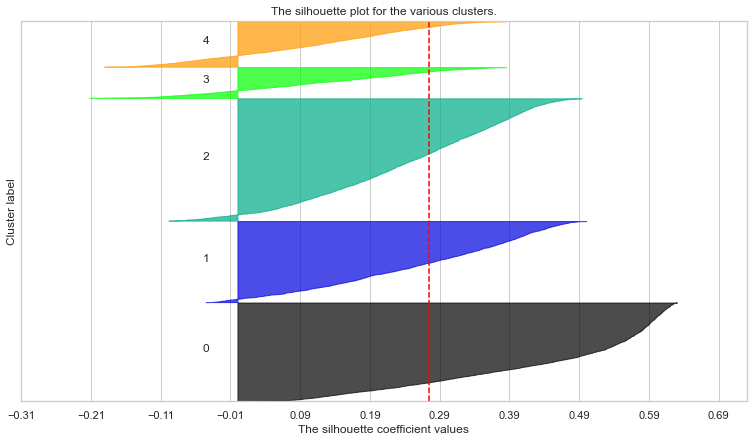

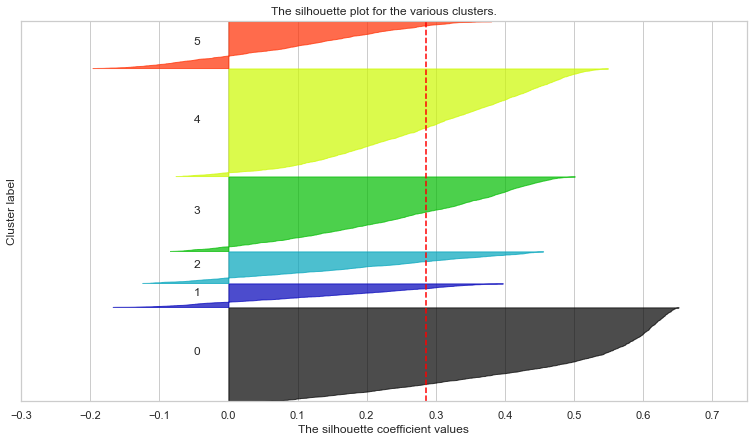

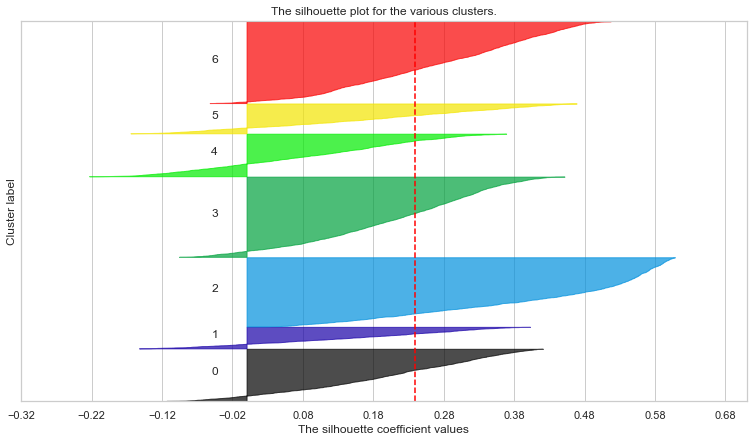

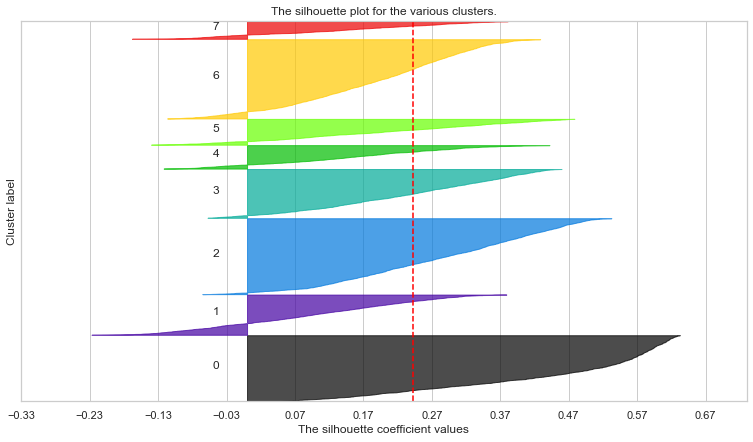

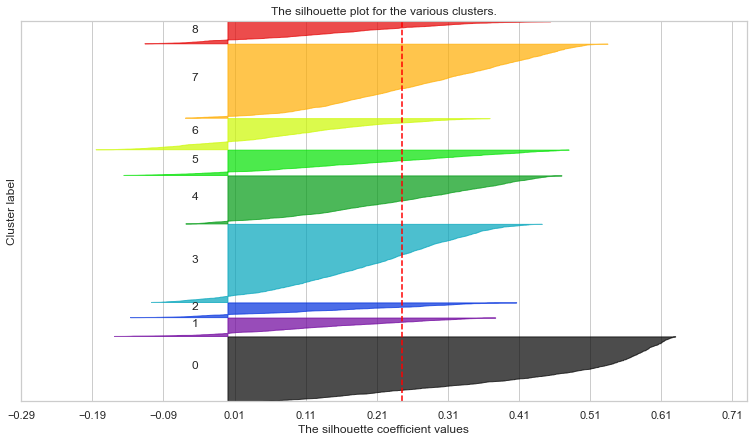

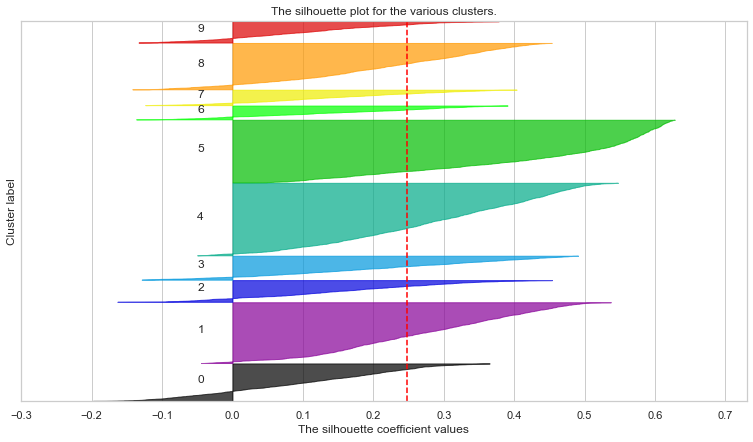

In [154]:
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(product[product_metric])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(product[product_metric], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(product[product_metric], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(product[product_metric]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

In [283]:
kmclust = KMeans(n_clusters=4 , init="random", random_state=1)
kmclust.fit(product[product_metric])
kmclust.predict(product[product_metric])
#pd.DataFrame(kmclust.tansform(df_minmax))
df_clustered = product[product_metric]
df_clustered['cluster'] = kmclust.predict(product[product_metric])
df_clustered

pd.set_option('display.max_columns', None)
df_summary = df_clustered.groupby('cluster').mean()
df_summary

,Dryred,Sweetwh,Exotic,Dessert,Drywh,Sweetred
cluster,,,,,,
0,0.189345,0.297771,0.435458,0.223573,0.357351,0.259761
1,0.557952,0.084210,0.134990,0.067968,0.378101,0.077337
2,0.804343,0.027668,0.112951,0.022578,0.190502,0.025622
3,0.311812,0.135189,0.132182,0.110509,0.573826,0.127328


In [284]:
df_product = df_summary.copy()

In [285]:
df_product = df_product.T

In [286]:
df_product.sort_index(inplace = True)

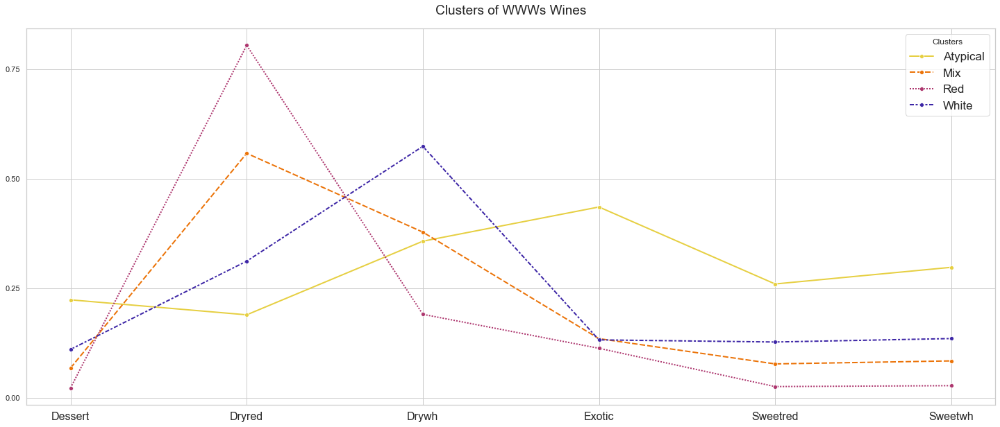

In [381]:
sns.set_theme(style="whitegrid")
ax = fig.add_subplot(111)

plt.figure(figsize=(25,10))
plt.yticks([0,0.25,0.5,0.75,1])
plt.xticks(fontsize = 16)
plt.title('Clusters of WWWs Wines', fontdict = {'fontsize' :19}, pad = 20)


ax.tick_params(axis='y',direction='inout', length=20)
sns.lineplot(data=df_product, marker='o', linewidth=2.0, palette='CMRmap_r')
plt.legend(title='Clusters', loc='upper right', labels=['Atypical','Mix','Red','White'],prop={'size': 17})

In [288]:
df_product1 = df_summary.copy()

In [291]:
df_product1['count'] = df_clustered.groupby('cluster').count()['Exotic']
df_product1

,Dryred,Sweetwh,Exotic,Dessert,Drywh,Sweetred,count
cluster,,,,,,,
0,0.189345,0.297771,0.435458,0.223573,0.357351,0.259761,1362
1,0.557952,0.084210,0.134990,0.067968,0.378101,0.077337,3271
2,0.804343,0.027668,0.112951,0.022578,0.190502,0.025622,2604
3,0.311812,0.135189,0.132182,0.110509,0.573826,0.127328,2502


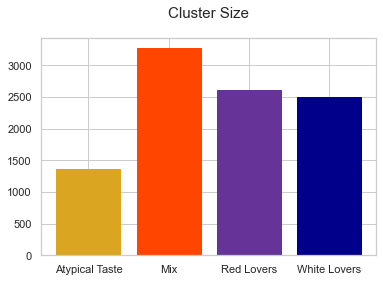

In [389]:
y_pos = np.arange(len(df_product1.index))

plt.xticks(y_pos,['Atypical Taste','Mix','Red Lovers','White Lovers'])
b = plt.bar(df_product1.index, df_product1['count'])
plt.title ('Cluster Size',fontdict = {'fontsize' :15}, pad = 20 )
b[0].set_color('goldenrod')
b[1].set_color('orangered')
b[2].set_color('rebeccapurple')
b[3].set_color('darkblue')

## Merging Clusters 

In [312]:
customer_features = ['Dayswus','Monetary','Income','WebPurchase','Age','WebVisit','Edu','Freq','Recency',
                     'Perdeal','LTV']

product_features = ['Exotic','Dessert','Drywh','Sweetwh','Sweetred','Dryred']

In [313]:
df_cust = df_minmax[customer_features].copy()
df_prd = df_minmax[product_features].copy()

In [314]:
df = df_minmax.copy()

In [315]:
# Applying the right clustering (algorithm and number of clusters) for each perspective
kmeans_cust = KMeans(
    n_clusters=3,
    init='k-means++',
    n_init=20,
    random_state=42
)
prod_labels = kmeans_cust.fit_predict(df_cust)

kmeans_prd = KMeans(
    n_clusters=4,
    init='k-means++',
    n_init=20,
    random_state=42
)
customer_labels = kmeans_prd.fit_predict(df_prd)

df['product_labels'] = prod_labels
df['customer_labels'] = customer_labels

In [316]:
df.groupby(['product_labels', 'customer_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('customer_labels', 'product_labels', 0)

product_labels,0,1,2
customer_labels,,,
0,340,725,1530
1,1122,1071,334
2,1006,1236,1039
3,118,1083,135


In [317]:
# Clusters with low frequency to be merged:
to_merge = [(2,2), (2,0), (0,2), (3,1)]

df_centroids = df.groupby(['customer_labels', 'product_labels'])\
    [metric_features].mean()

# Computing the euclidean distance matrix between the centroids
euclidean = pairwise_distances(df_centroids)
df_dists = pd.DataFrame(
    euclidean, columns=df_centroids.index, index=df_centroids.index
)

# Merging each low frequency clustering (source) to the closest cluster (target)
source_target = {}
for clus in to_merge:
    if clus not in source_target.values():
        source_target[clus] = df_dists.loc[clus].sort_values().index[1]

source_target

{(2, 2): (1, 2), (2, 0): (0, 0), (0, 2): (2, 2), (3, 1): (1, 1)}

In [318]:
df_ = df.copy()

for source, target in source_target.items():
    mask = (df_['customer_labels']==source[0]) & (df_['product_labels']==source[1])
    df_.loc[mask, 'customer_labels'] = target[0]
    df_.loc[mask, 'product_labels'] = target[1]

df_.groupby(['product_labels', 'customer_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('customer_labels', 'product_labels', 0)

product_labels,0,1,2
customer_labels,,,
0,1346.0,725.0,NaN
1,1122.0,2154.0,1373.0
2,NaN,1236.0,1530.0
3,118.0,NaN,135.0


In [411]:
df_centroids = df.groupby(['customer_labels', 'product_labels'])\
    [metric_features].mean()
df_centroids

Dayswus       Age       Edu    Income  \
customer_labels product_labels                                           
0               0               0.532168  0.797941  0.744485  0.786754   
                1               0.495624  0.371908  0.707586  0.355285   
                2               0.490684  0.556362  0.700735  0.556841   
1               0               0.492977  0.868865  0.568627  0.813443   
                1               0.492113  0.194958  0.552754  0.243816   
                2               0.473015  0.597804  0.513473  0.568956   
2               0               0.519473  0.826541  0.665507  0.794480   
                1               0.501948  0.282093  0.635113  0.303912   
                2               0.491342  0.594803  0.605751  0.575567   
3               0               0.480969  0.825565  0.360169  0.795285   
                1               0.492694  0.100015  0.348338  0.172460   
                2               0.489683  0.541358  0.410185  0.543410   

                                    Freq   Recency  Monetary       LTV  \
customer_labels product_labels                                           
0               0               0.570761  0.088112  0.521768  0.426469   
                1               0.084165  0.129198  0.047060  0.093501   
                2               0.275817  0.094043  0.205164  0.185948   
1               0               0.569239  0.089281  0.520325  0.443325   
                1               0.060911  0.148762  0.030275  0.100804   
                2               0.268404  0.093769  0.196008  0.185886   
2               0               0.567575  0.095375  0.518270  0.435292   
                1               0.070372  0.137107  0.037227  0.097562   
                2               0.275982  0.092093  0.203984  0.188054   
3               0               0.510136  0.089222  0.452429  0.389389   
                1               0.051853  0.151776  0.022861  0.101197   
                2               0.221351  0.094407  0.152387  0.165056   

                                 Perdeal    Dryred  Sweetred     Drywh  \
customer_labels product_labels                                           
0               0               0.056549  0.760114  0.034213  0.226027   
                1               0.647963  0.791682  0.024239  0.210864   
                2               0.234122  0.820788  0.024356  0.172164   
1               0               0.025461  0.310852  0.126009  0.576808   
                1               0.578321  0.300911  0.127190  0.589259   
                2               0.199025  0.343334  0.140366  0.500000   
2               0               0.043256  0.545705  0.080327  0.390125   
                1               0.627506  0.565171  0.069175  0.392129   
                2               0.209976  0.562374  0.084088  0.349322   
3               0               0.031627  0.225268  0.261092  0.346645   
                1               0.568343  0.170059  0.262601  0.366018   
                2               0.200153  0.304308  0.238671  0.292339   

                                 Sweetwh   Dessert    Exotic  WebPurchase  \
customer_labels product_labels                                              
0               0               0.037002  0.030596  0.052665     0.291632   
                1               0.027097  0.020923  0.146925     0.602644   
                2               0.025859  0.021577  0.110049     0.516324   
1               0               0.138232  0.107461  0.078348     0.139303   
                1               0.132526  0.112069  0.192062     0.654428   
                2               0.143761  0.122405  0.125936     0.395709   
2               0               0.084589  0.069040  0.071653     0.202192   
                1               0.074434  0.060743  0.189076     0.609907   
                2               0.094492  0.075335  0.131537     0.419508   
3               0               0.299891  0.184790  0.276571     0.174233  

In [412]:
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids)

In [405]:
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=4
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

df_centroids

Dayswus       Age       Edu    Income  \
customer_labels product_labels                                           
0               0               0.532168  0.797941  0.744485  0.786754   
                1               0.495624  0.371908  0.707586  0.355285   
                2               0.490684  0.556362  0.700735  0.556841   
1               0               0.492977  0.868865  0.568627  0.813443   
                1               0.492113  0.194958  0.552754  0.243816   
                2               0.473015  0.597804  0.513473  0.568956   
2               0               0.519473  0.826541  0.665507  0.794480   
                1               0.501948  0.282093  0.635113  0.303912   
                2               0.491342  0.594803  0.605751  0.575567   
3               0               0.480969  0.825565  0.360169  0.795285   
                1               0.492694  0.100015  0.348338  0.172460   
                2               0.489683  0.541358  0.410185  0.543410   

                                    Freq   Recency  Monetary       LTV  \
customer_labels product_labels                                           
0               0               0.570761  0.088112  0.521768  0.426469   
                1               0.084165  0.129198  0.047060  0.093501   
                2               0.275817  0.094043  0.205164  0.185948   
1               0               0.569239  0.089281  0.520325  0.443325   
                1               0.060911  0.148762  0.030275  0.100804   
                2               0.268404  0.093769  0.196008  0.185886   
2               0               0.567575  0.095375  0.518270  0.435292   
                1               0.070372  0.137107  0.037227  0.097562   
                2               0.275982  0.092093  0.203984  0.188054   
3               0               0.510136  0.089222  0.452429  0.389389   
                1               0.051853  0.151776  0.022861  0.101197   
                2               0.221351  0.094407  0.152387  0.165056   

                                 Perdeal    Dryred  Sweetred     Drywh  \
customer_labels product_labels                                           
0               0               0.056549  0.760114  0.034213  0.226027   
                1               0.647963  0.791682  0.024239  0.210864   
                2               0.234122  0.820788  0.024356  0.172164   
1               0               0.025461  0.310852  0.126009  0.576808   
                1               0.578321  0.300911  0.127190  0.589259   
                2               0.199025  0.343334  0.140366  0.500000   
2               0               0.043256  0.545705  0.080327  0.390125   
                1               0.627506  0.565171  0.069175  0.392129   
                2               0.209976  0.562374  0.084088  0.349322   
3               0               0.031627  0.225268  0.261092  0.346645   
                1               0.568343  0.170059  0.262601  0.366018   
                2               0.200153  0.304308  0.238671  0.292339   

                                 Sweetwh   Dessert    Exotic  WebPurchase  \
customer_labels product_labels                                              
0               0               0.037002  0.030596  0.052665     0.291632   
                1               0.027097  0.020923  0.146925     0.602644   
                2               0.025859  0.021577  0.110049     0.516324   
1               0               0.138232  0.107461  0.078348     0.139303   
                1               0.132526  0.112069  0.192062     0.654428   
                2               0.143761  0.122405  0.125936     0.395709   
2               0               0.084589  0.069040  0.071653     0.202192   
                1               0.074434  0.060743  0.189076     0.609907   
                2               0.094492  0.075335  0.131537     0.419508   
3               0               0.299891  0.184790  0.276571     0.174233  

In [323]:
cluster_mapper = df_centroids['hclust_labels'].to_dict()

df_ = df.copy()

df_['merged_labels'] = df_.apply(
    lambda row: cluster_mapper[
        (row['customer_labels'], row['product_labels'])
    ], axis=1
)
df_.groupby('merged_labels').mean()[metric_features]

,Dayswus,Age,Edu,Income,Freq,Recency,Monetary,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit
merged_labels,,,,,,,,,,,,,,,,,
0,0.507889,0.841100,0.619925,0.801729,0.566095,0.091495,0.516617,0.435523,0.036752,0.457376,0.102333,0.447563,0.111431,0.085937,0.081412,0.185389,0.272660
1,0.492405,0.147222,0.449977,0.207939,0.056357,0.150277,0.026547,0.101002,0.573304,0.235120,0.195273,0.477016,0.219090,0.172274,0.331989,0.643857,0.680687
2,0.488922,0.573398,0.634751,0.563981,0.272638,0.093362,0.201408,0.185733,0.220496,0.656968,0.067062,0.274135,0.072278,0.058775,0.129571,0.464043,0.533278
3,0.499610,0.315298,0.661907,0.322905,0.075472,0.134183,0.040862,0.096060,0.635069,0.648914,0.052562,0.325114,0.056933,0.046021,0.173492,0.607222,0.665171


In [324]:
df_counts = df_.groupby('merged_labels')\
    .size()\
    .to_frame()

# Getting the product and behavior labels
df_counts = df_counts\
    .rename({v:k for k, v in cluster_mapper.items()})\
    .reset_index()

df_counts['customer_labels'] = df_counts['merged_labels'].apply(lambda x: x[0])
df_counts['product_labels'] = df_counts['merged_labels'].apply(lambda x: x[1])
df_counts.pivot('customer_labels', 'product_labels', 0)

product_labels,0,1,2
customer_labels,,,
2,NaN,1961.0,NaN
3,2586.0,2154.0,3038.0


In [325]:
df = df_.copy()

In [378]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    sns.set_theme(style="whitegrid")
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette('CMRmap'), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1],palette='CMRmap')

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(s=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

In [352]:
metric_features1 = df[metric_features].columns
metric_features1

Index(['Dayswus', 'Age', 'Edu', 'Income', 'Freq', 'Recency', 'Monetary', 'LTV',
       'Perdeal', 'Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert',
       'Exotic', 'WebPurchase', 'WebVisit'],
      dtype='object')

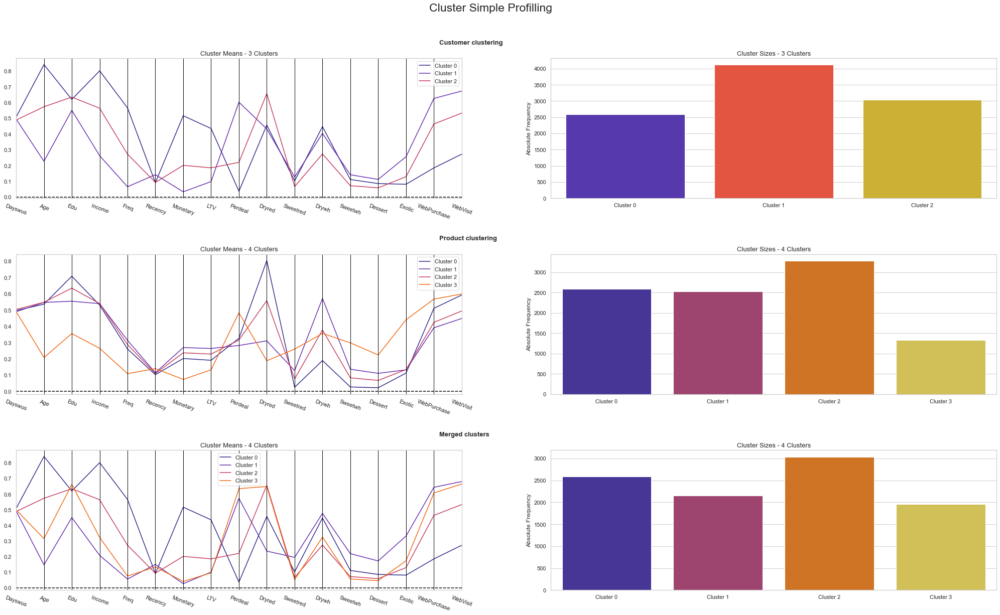

In [379]:
cluster_profiles(
    df = df[metric_features1.tolist() + ['product_labels', 'customer_labels', 'merged_labels']], 
    label_columns = ['product_labels', 'customer_labels', 'merged_labels'], 
    figsize = (35, 19), 
    compar_titles = ["Customer clustering", "Product clustering", "Merged clusters"]
)

### Evaluation With Decision Tree

In [391]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split

In [392]:
# Preparing the data
X = df.drop(columns=['product_labels','customer_labels','merged_labels'])
y = df.merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=42, max_depth=3)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 90.25% of the customers correctly


In [393]:
pd.Series(dt.feature_importances_, index=X_train.columns)

Dayswus        0.000000
Age            0.100838
Edu            0.000000
Income         0.000000
Kidhome        0.000000
Teenhome       0.000000
Freq           0.000000
Recency        0.000000
Monetary       0.000000
LTV            0.595973
Perdeal        0.000000
Dryred         0.275360
Sweetred       0.000000
Drywh          0.000000
Sweetwh        0.000000
Dessert        0.000000
Exotic         0.000000
WebPurchase    0.027829
WebVisit       0.000000
SMRack         0.000000
LGRack         0.000000
Humid          0.000000
Spcork         0.000000
Bucket         0.000000
Complain       0.000000
Mailfriend     0.000000
Emailfriend    0.000000
cluster        0.000000
dtype: float64

## Clustering of Binary Features with KMode

In [197]:
df_non_metric = df_minmax[non_metric_features]
df_non_metric

,Kidhome,Teenhome,SMRack,LGRack,Humid,Spcork,Bucket,Complain,Mailfriend,Emailfriend
Custid,,,,,,,,,,
1001,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1003,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
1004,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1005,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
10995,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10996,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
10998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [198]:
#KMODE
km_cao = KModes(n_clusters=4, init = "Huang", n_init = 1, verbose=1)
fitClusters_cao = km_cao.fit_predict(df_non_metric)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 1821, cost: 5845.0


In [199]:
pd.set_option('display.max_columns', None)
df_non_metric['cluster'] = fitClusters_cao
df_summary = df_non_metric.groupby('cluster').mean()
df_summary['count'] = df_non_metric.groupby('cluster').count()['Kidhome']
df_summary

<ipython-input-199-252307f64e2f>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Kidhome,Teenhome,SMRack,LGRack,Humid,Spcork,Bucket,Complain,Mailfriend,Emailfriend,count
cluster,,,,,,,,,,,
0,1.000000,0.414885,0.083698,0.022920,0.007211,0.010301,0.002575,0.013392,0.087046,0.078032,3883
1,0.000000,1.000000,0.031837,0.112390,0.027618,0.039125,0.021097,0.009590,0.000000,0.006904,2607
2,0.324575,0.701700,0.411128,0.010819,0.061824,0.064915,0.010819,0.007728,1.000000,0.242658,647
3,0.000000,0.000000,0.044965,0.104535,0.216756,0.166410,0.018447,0.010761,0.000000,0.004612,2602


In [200]:
fitClusters_cao

array([3, 3, 0, ..., 3, 0, 0], dtype=uint16)

In [203]:
clusterCentroidsDf = pd.DataFrame(km_cao.cluster_centroids_)
clusterCentroidsDf.columns = df_minmax[non_metric_features].columns

In [204]:
clusterCentroidsDf

,Kidhome,Teenhome,SMRack,LGRack,Humid,Spcork,Bucket,Complain,Mailfriend,Emailfriend
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
